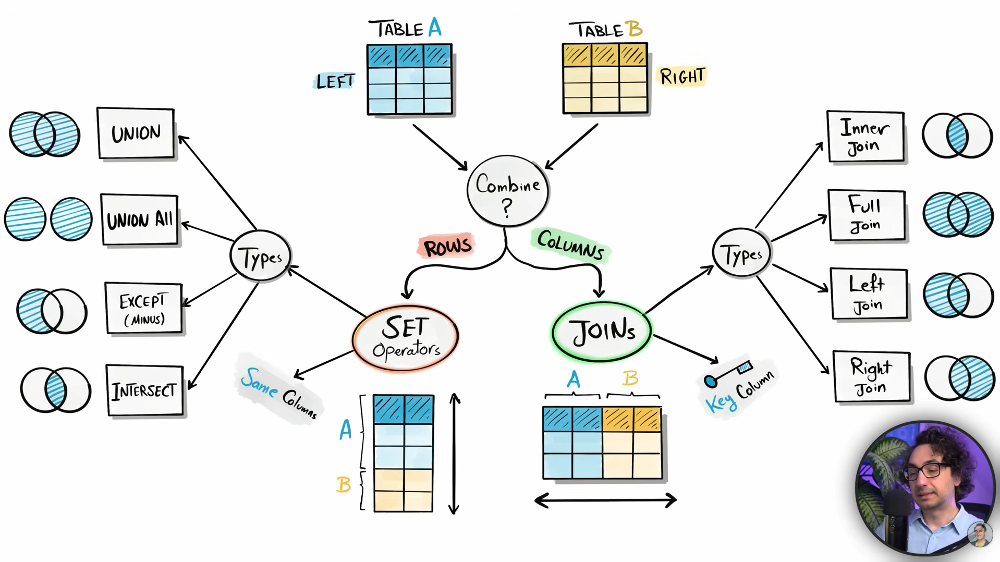

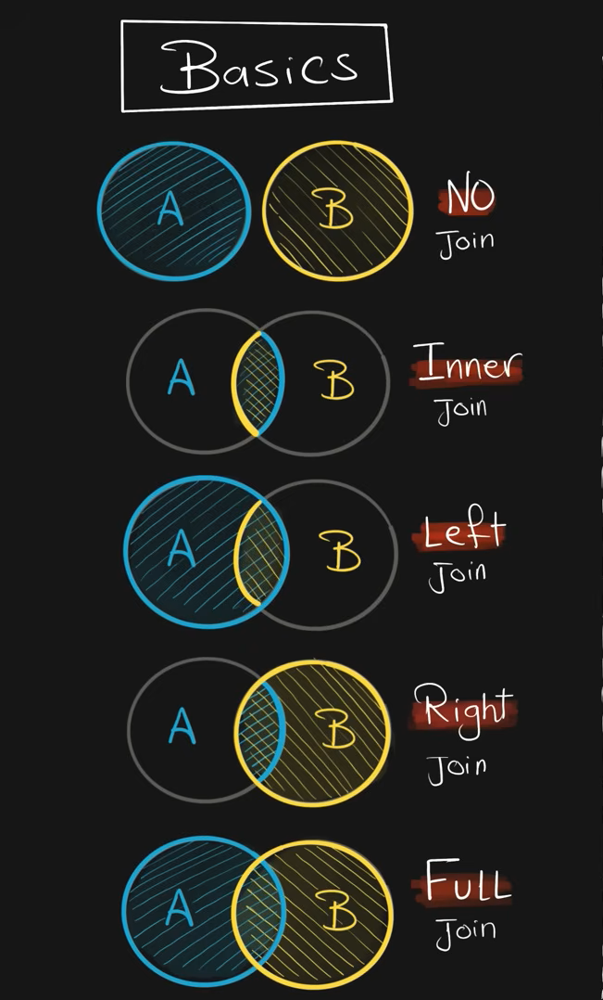

## What is JOINS?

```
a clause used to combine rows from two or more tables based on a related column between them
```

## Why we need JOINS?

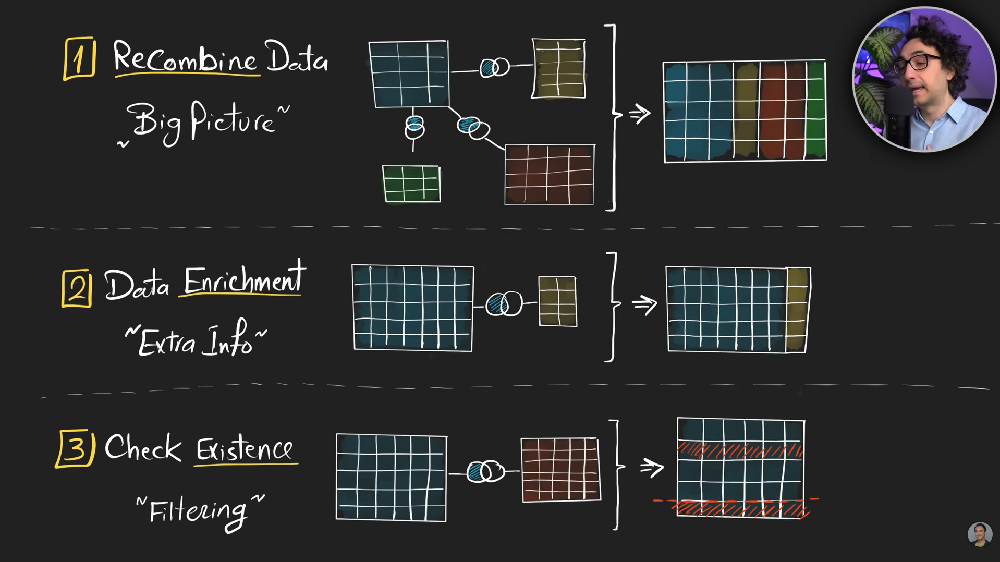

## Types of JOINS

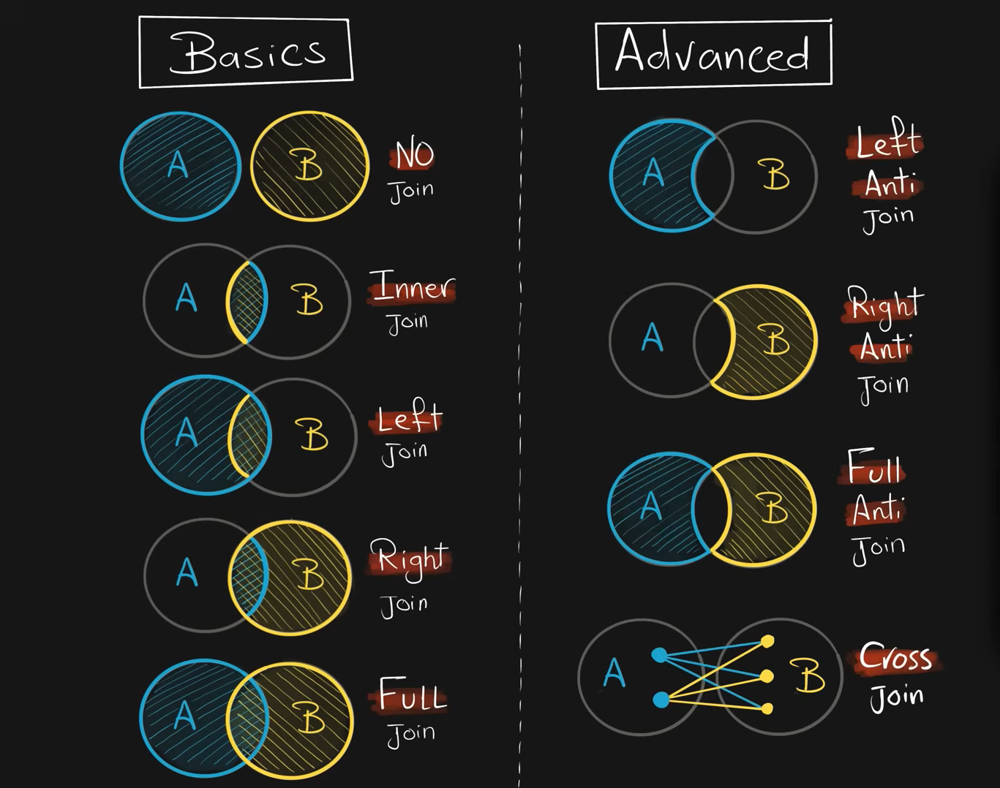

## Basic JOINS

### NO JOINS

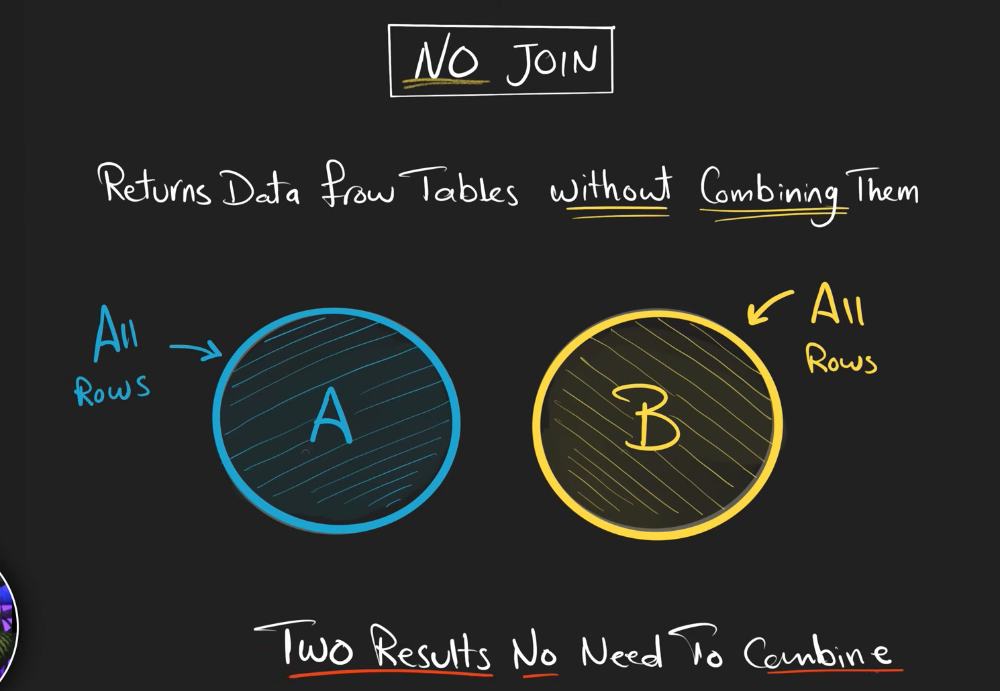

#### Syntax :
```
SELECT *
FROM fistTable;
SELECT *
FROM secondTable;
```

#### Retrieve all data from customers and orders in two different results.

In [5]:
%%sql
select * from customers;

Running query in 'mysql+pymysql://'

5 rows affected.

id,first_name,country,score
1,Maria,Germany,350
2,John,USA,900
3,Georg,UK,750
4,Martin,Germany,500
5,Peter,USA,0


In [6]:
%%sql
select * from orders;

Running query in 'mysql+pymysql://'

4 rows affected.

order_id,customer_id,order_date,sales
1001,1,2021-01-11,35
1002,2,2021-04-05,15
1003,3,2021-06-18,20
1004,6,2021-08-31,10


### INNER JOIN : Returns ONLY MATCHING ROWS from both tables

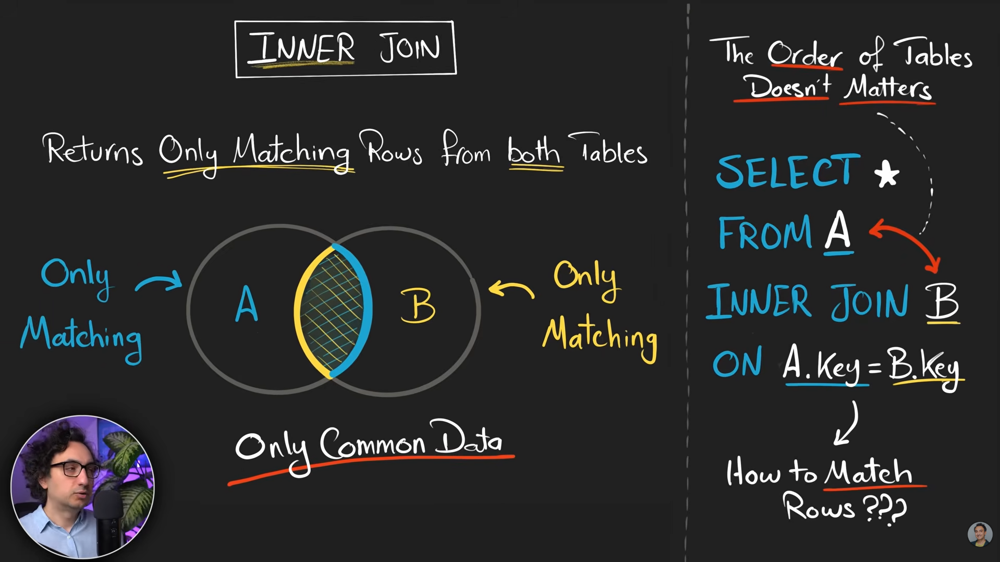

#### Syntax : 
```
SELECT *
FROM firstTable
    INNER JOIN secondTable 
    ON { condition(first.key = second.key) };
```

#### Get all the customers along with their orders, but only for customers who have placed an order

In [9]:
%%sql
select *
from customers
    inner join orders 
    ON customers.id = orders.customer_id;

Running query in 'mysql+pymysql://'

3 rows affected.

id,first_name,country,score,order_id,customer_id,order_date,sales
1,Maria,Germany,350,1001,1,2021-01-11,35
2,John,USA,900,1002,2,2021-04-05,15
3,Georg,UK,750,1003,3,2021-06-18,20


##### USING ALIAS

In [12]:
%%sql
select c.id,
    c.first_name,
    c.country,
    c.score,
    o.order_id,
    o.order_date,
    o.sales
from customers as c
    inner join orders as o ON c.id = o.customer_id;

Running query in 'mysql+pymysql://'

3 rows affected.

id,first_name,country,score,order_id,order_date,sales
1,Maria,Germany,350,1001,2021-01-11,35
2,John,USA,900,1002,2021-04-05,15
3,Georg,UK,750,1003,2021-06-18,20


### LEFT JOIN : Returns ALL ROWS from LEFT table and ONLY MATCHING from RIGHT table

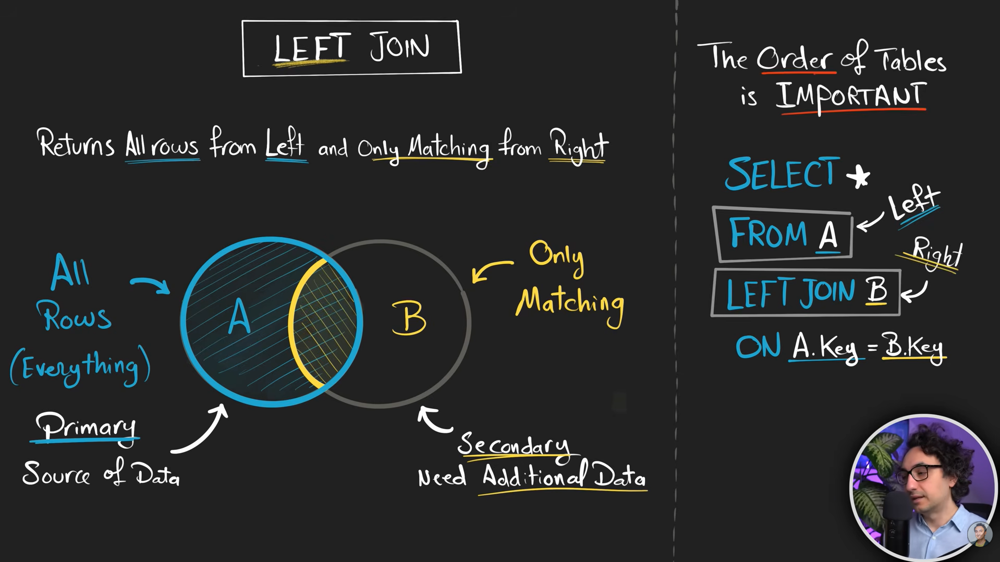

#### Syntax :
```
SELECT *
FROM firstTable
    LEFT JOIN secondTable 
    ON first.key = second.key;
```

#### Get all customers along with their orders including those without orders

In [19]:
%%sql
select *
from customers
    LEFT JOIN orders 
    ON customers.id = orders.customer_id;

Running query in 'mysql+pymysql://'

5 rows affected.

id,first_name,country,score,order_id,customer_id,order_date,sales
1,Maria,Germany,350,1001,1,2021-01-11,35
2,John,USA,900,1002,2,2021-04-05,15
3,Georg,UK,750,1003,3,2021-06-18,20
4,Martin,Germany,500,None,None,None,None
5,Peter,USA,0,None,None,None,None


##### Modified Version

In [24]:
%%sql
select c.id,
    c.first_name,
    c.country,
    c.score,
    o.order_id,
    IFNULL(o.order_date, 'unknown') as order_date,
    IFNULL(o.sales, 0) as sales
from customers as c
    LEFT JOIN orders as o 
    ON c.id = o.customer_id;

Running query in 'mysql+pymysql://'

5 rows affected.

id,first_name,country,score,order_id,order_date,sales
1,Maria,Germany,350,1001,2021-01-11,35
2,John,USA,900,1002,2021-04-05,15
3,Georg,UK,750,1003,2021-06-18,20
4,Martin,Germany,500,None,unknown,0
5,Peter,USA,0,None,unknown,0


#### Get all customers along with their orders, including orders without matching customers.

In [8]:
%%sql
select c.id,
    c.first_name,
    c.country,
    c.score,
    o.order_id,
    o.customer_id,
    o.order_date,
    o.sales
from orders as o
    left join customers as c 
    ON o.customer_id = c.id;

Running query in 'mysql+pymysql://'

4 rows affected.

id,first_name,country,score,order_id,customer_id,order_date,sales
1,Maria,Germany,350,1001,1,2021-01-11,35
2,John,USA,900,1002,2,2021-04-05,15
3,Georg,UK,750,1003,3,2021-06-18,20
None,None,None,None,1004,6,2021-08-31,10


### RIGHT JOIN : Returns ALL ROWS from RIGHT table and ONLY MATCHING from LEFT table

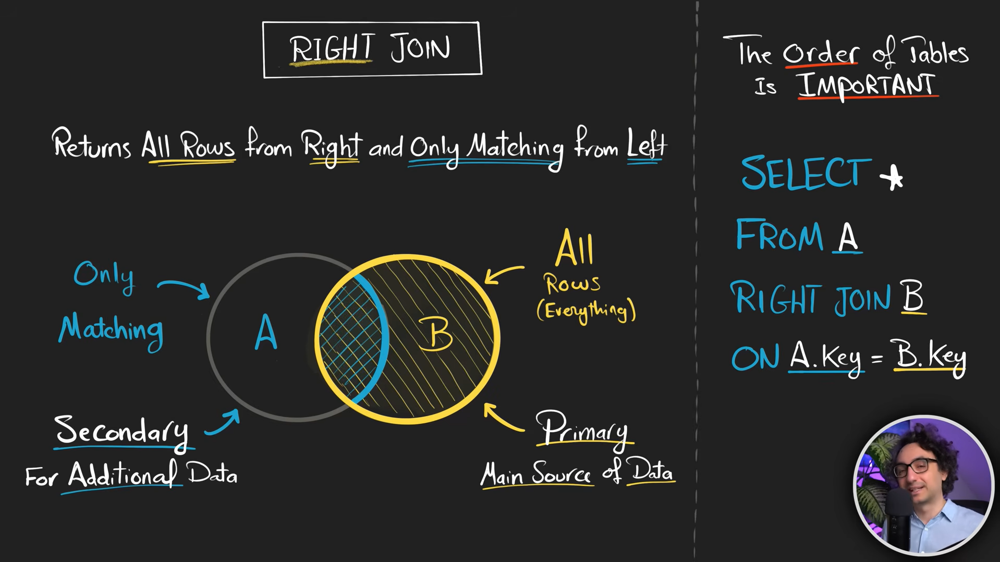

#### Syntax :
```
SELECT *
FROM firstTable
    RIGHT JOIN secondTable 
    ON first.key = second.key;
```

#### Get all customers along with their orders, including orders without matching customers.

In [6]:
%%sql
select *
from customers as c
    right join orders as o 
    ON c.id = o.customer_id;

Running query in 'mysql+pymysql://'

4 rows affected.

id,first_name,country,score,order_id,customer_id,order_date,sales
1,Maria,Germany,350,1001,1,2021-01-11,35
2,John,USA,900,1002,2,2021-04-05,15
3,Georg,UK,750,1003,3,2021-06-18,20
None,None,None,None,1004,6,2021-08-31,10


### FULL JOIN : Returns all rows from BOTH tables

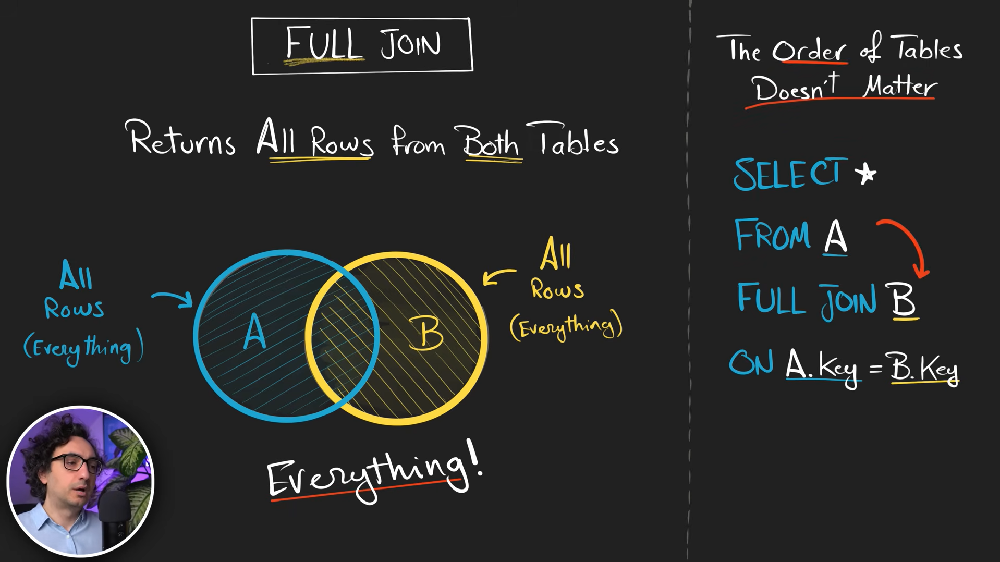

#### Syntax :
```
SELECT *
FROM firstTable
    FULL JOIN secondTable 
    ON first.key = second.key;
```

#### FULL JOIN does not works in MySQL
#### so it works using (LEFT UNIOUN RIGHT)

#### Synatx :
```
SELECT *
FROM firstTable
    LEFT JOIN secondTable 
    ON first.key = second.key

UNION

SELECT *
FROM firstTable
    RIGHT JOIN secondTable 
    ON first.key = second.key
```

#### (NOT WORKING CASE) Get all customers and all orders, even if there's no match. 

In [11]:
%%sql
select *
from customers as c
    FULL JOIN orders as o 
    ON c.id = o.customer_id;

Running query in 'mysql+pymysql://'

RuntimeError: If using snippets, you may pass the --with argument explicitly.
For more details please refer: https://jupysql.ploomber.io/en/latest/compose.html#with-argument


Original error message from DB driver:
(pymysql.err.ProgrammingError) (1064, "You have an error in your SQL syntax; check the manual that corresponds to your MySQL server version for the right syntax to use near 'FULL JOIN orders as o\n    ON c.id = o.customer_id' at line 3")
[SQL: select *
from customers as c
    FULL JOIN orders as o
    ON c.id = o.customer_id;]
(Background on this error at: https://sqlalche.me/e/20/f405)



#### (WORKING CASE) Get all customers and all orders, even if there's no match. 

In [14]:
%%sql
select *
from customers as c
    left join orders as o 
    ON c.id = o.customer_id

UNION

select *
from customers as c
    right join orders as o 
    ON c.id = o.customer_id;

Running query in 'mysql+pymysql://'

6 rows affected.

id,first_name,country,score,order_id,customer_id,order_date,sales
1,Maria,Germany,350,1001,1,2021-01-11,35
2,John,USA,900,1002,2,2021-04-05,15
3,Georg,UK,750,1003,3,2021-06-18,20
4,Martin,Germany,500,None,None,None,None
5,Peter,USA,0,None,None,None,None
None,None,None,None,1004,6,2021-08-31,10


## ADVANCED JOINS

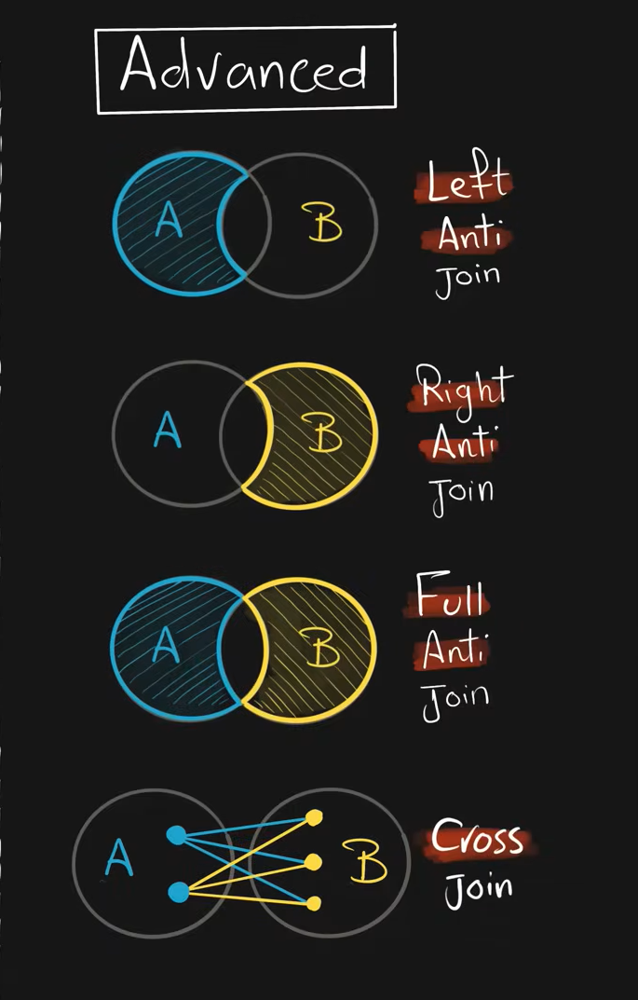

### LEFT-ANTI JOIN : Returns ROW from LEFT TABLE that has NO MATCH in the RIGHT TABLE

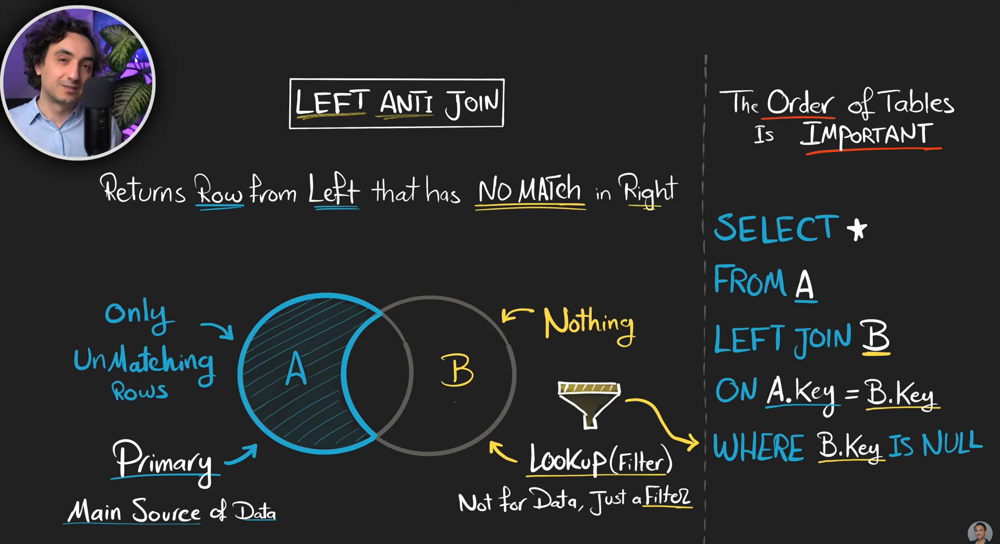

#### Syntax :
```
SELECT *
FROM firstTable
    LEFT JOIN secondTable 
    ON first.key = second.key
WHERE second.key IS NULL;
```

#### Get all customers who haven't placed any orders.

##### Method 1: (Get customers and orders both data)

In [20]:
%%sql
SELECT *
FROM customers as c
    LEFT JOIN orders as o 
    ON c.id = o.customer_id
where o.customer_id IS NULL;

Running query in 'mysql+pymysql://'

2 rows affected.

id,first_name,country,score,order_id,customer_id,order_date,sales
4,Martin,Germany,500,None,None,None,None
5,Peter,USA,0,None,None,None,None


##### Method 2: (Get only customers data)

In [25]:
%%sql
SELECT c.*
FROM customers as c
    LEFT JOIN orders as o 
    ON c.id = o.customer_id
where o.customer_id IS NULL;

Running query in 'mysql+pymysql://'

2 rows affected.

id,first_name,country,score
4,Martin,Germany,500
5,Peter,USA,0


### RIGHT ANTI JOIN : Returns ROWS from RIGHT TABLE that has ON MATCH in LEFT TABLE

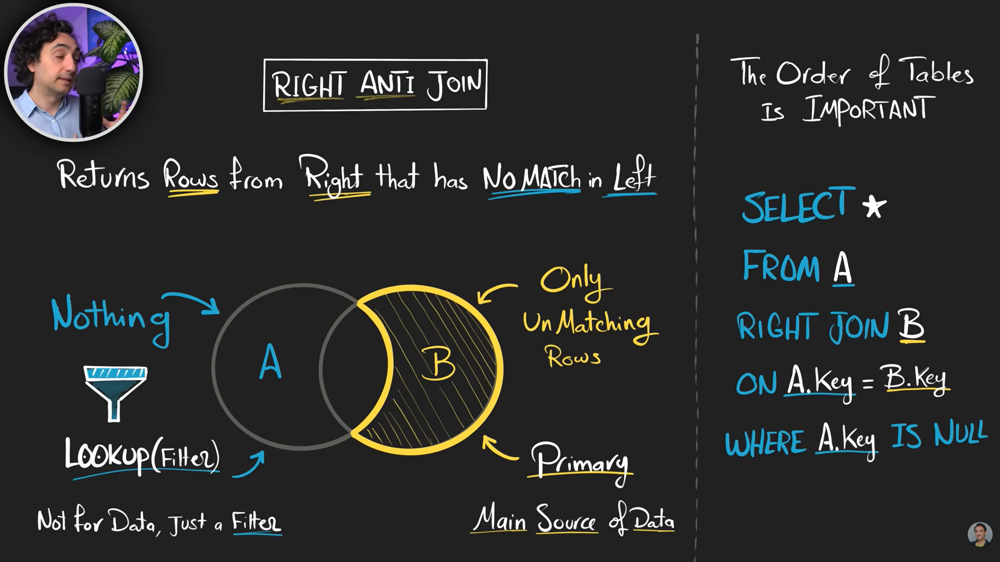

#### Syntax :
```
SELECT *
FROM firstTable
    RIGHT JOIN second Table 
    ON first.key = second.key
WHERE first.key IS NULL;
```

#### Get all Orders without any match in customers or don't have any valid customer for that order.

##### Method 1: Get both table

In [28]:
%%sql
select *
from customers as c
    RIGHT JOIN orders as o 
    ON c.id = o.customer_id
WHERE c.id IS NULL;

Running query in 'mysql+pymysql://'

1 rows affected.

id,first_name,country,score,order_id,customer_id,order_date,sales
None,None,None,None,1004,6,2021-08-31,10


##### Method 2 : Only Orders table 

In [32]:
%%sql
select o.*
from customers as c
    RIGHT JOIN orders as o 
    ON c.id = o.customer_id
WHERE c.id IS NULL;

Running query in 'mysql+pymysql://'

1 rows affected.

order_id,customer_id,order_date,sales
1004,6,2021-08-31,10


##### Method 3 : Using LEFT JOIN

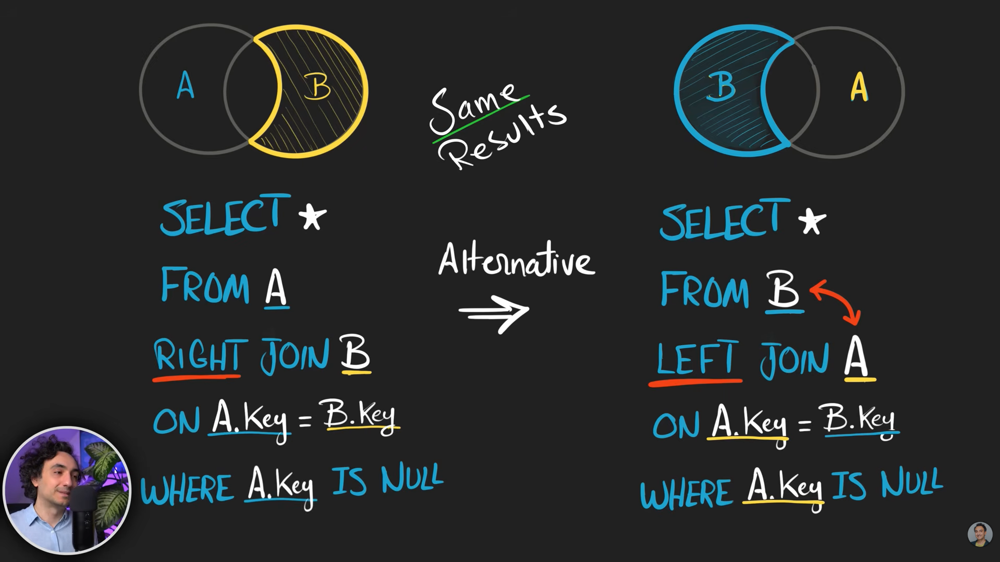

In [35]:
%%sql
select o.*
from orders as o
    LEFT JOIN customers as c 
    ON c.id = o.customer_id
WHERE c.id IS NULL;

Running query in 'mysql+pymysql://'

1 rows affected.

order_id,customer_id,order_date,sales
1004,6,2021-08-31,10


### FULL ANTI JOIN : Returns only rows that DON'T MATCH in either tables

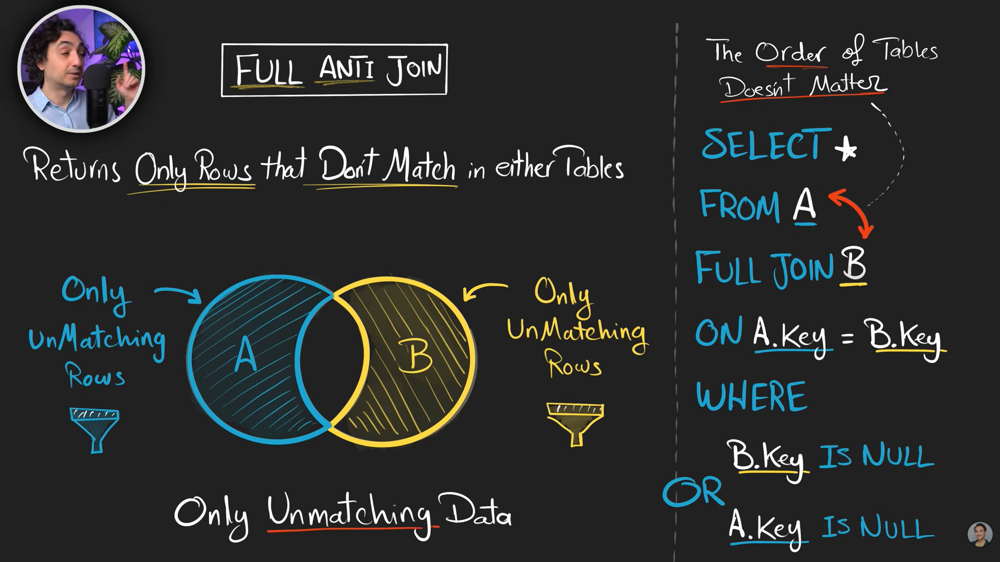

#### Syntax :

##### For Oracle or MSSQL
```
SELECT *
FROM firstTable
    FULL JOIN secondTable 
    ON first.key = second.key
WHERE fisrt.key IS NULL
    OR second.key IS NULL;
```

##### For MySQL
```
SELECT *
FROM firstTable
    LEFT JOIN secondTable 
    ON first.key = second.key
WHERE second.key IS NULL

UNION ALL

SELECT *
FROM firstTable
    RIGHT JOIN secondTable 
    ON first.key = second.key
WHERE first.key IS NULL;
```

#### Find all customers without orders and all orders without customers.

In [50]:
%%sql
select *
from customers as c
    LEFT join orders as o 
    ON c.id = o.customer_id
WHERE o.customer_id is null

union all

select *
from customers as c
    RIGHT join orders as o 
    ON c.id = o.customer_id
WHERE c.id is null;

Running query in 'mysql+pymysql://'

3 rows affected.

id,first_name,country,score,order_id,customer_id,order_date,sales
4,Martin,Germany,500,None,None,None,None
5,Peter,USA,0,None,None,None,None
None,None,None,None,1004,6,2021-08-31,10


#### CHALLANGE : Get all customers along with their orders, but only for customers who have placed an order (WITHOUT USING INNER JOIN).

##### Method : USING ANTI FULL JOIN

In [58]:
%%sql
select distinct cus.* from(

select *
from customers as c
    LEFT join orders as o 
    ON c.id = o.customer_id
WHERE o.customer_id is not null

union all

select *
from customers as c
    RIGHT join orders as o 
    ON c.id = o.customer_id
WHERE c.id is not null

) as cus;

Running query in 'mysql+pymysql://'

3 rows affected.

id,first_name,country,score,order_id,customer_id,order_date,sales
1,Maria,Germany,350,1001,1,2021-01-11,35
2,John,USA,900,1002,2,2021-04-05,15
3,Georg,UK,750,1003,3,2021-06-18,20


##### Method : USING ANTI LEFT JOIN

In [60]:
%%sql
select *
from customers as c
    left join orders as o 
    on c.id = o.customer_id
where o.customer_id is not null;

Running query in 'mysql+pymysql://'

3 rows affected.

id,first_name,country,score,order_id,customer_id,order_date,sales
1,Maria,Germany,350,1001,1,2021-01-11,35
2,John,USA,900,1002,2,2021-04-05,15
3,Georg,UK,750,1003,3,2021-06-18,20


### CROSS JOIN : Combines every from Left Table with every row with Right Table

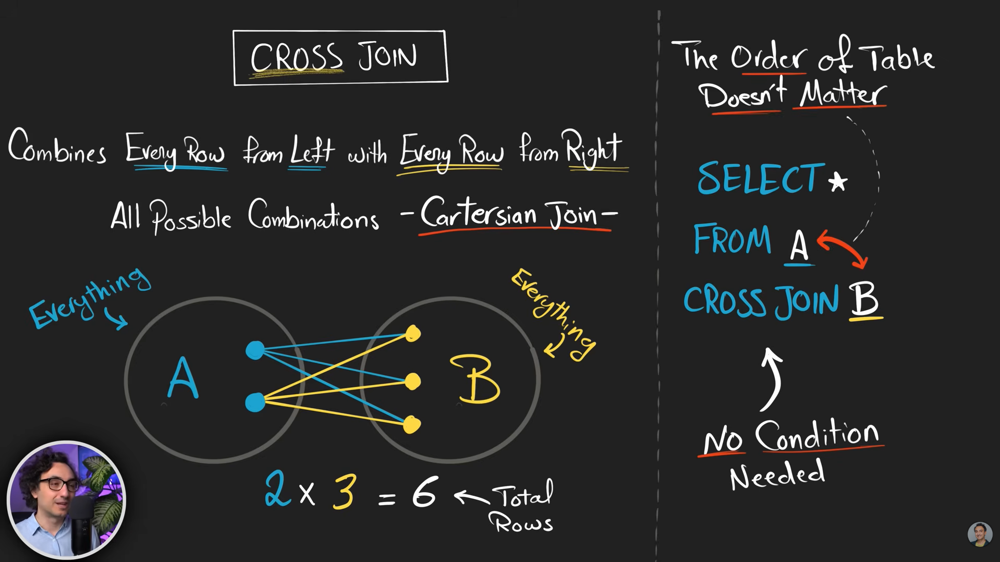

#### Syntax:
```
SELECT *
FROM firstTable
    CROSS JOIN secondTable;
```

#### Generate all possible combinations of customers and orders.

In [7]:
%%sql
select *
from customers
    cross join orders;

Running query in 'mysql+pymysql://'

20 rows affected.

id,first_name,country,score,order_id,customer_id,order_date,sales
1,Maria,Germany,350,1004,6,2021-08-31,10
1,Maria,Germany,350,1003,3,2021-06-18,20
1,Maria,Germany,350,1002,2,2021-04-05,15
1,Maria,Germany,350,1001,1,2021-01-11,35
2,John,USA,900,1004,6,2021-08-31,10
2,John,USA,900,1003,3,2021-06-18,20
2,John,USA,900,1002,2,2021-04-05,15
2,John,USA,900,1001,1,2021-01-11,35
3,Georg,UK,750,1004,6,2021-08-31,10
3,Georg,UK,750,1003,3,2021-06-18,20
